In [1]:
from pycisTopic.clust_vis import (
    find_clusters,
    run_umap,
    run_tsne,
    plot_metadata,
    plot_topic,
)
import os
import glob
import pickle
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, display
import math

%load_ext lab_black

In [2]:
samples = [
    x.split("/")[-1].split("__")[0]
    for x in sorted(glob.glob("cistopic_objects/*singlets.model*topics.pkl"))
]
if len(samples) > len(set(samples)):
    print("samples are not unique!")
else:
    print("samples are unique.")

samples are unique.


In [3]:
prediction_path_dict = {
    x.split("/")[-1].split(f"__")[0]: x
    for x in sorted(glob.glob("cell_type_classification/*__cell_type_seurat.txt"))
}
prediction_path_dict

{'master_all_1.FIXEDCELLS': 'cell_type_classification/master_all_1.FIXEDCELLS__cell_type_seurat.txt'}

In [4]:
cto_model_path_dict = {
    x.split("/")[-1].split(f"__")[0]: x
    for x in sorted(glob.glob("cistopic_objects_master/*singlets.model*topics.pkl"))
}
cto_model_path_dict

{'master_all_1.FIXEDCELLS': 'cistopic_objects_master/master_all_1.FIXEDCELLS__cto.scrublet0-4.fmx.singlets.model_24topics.pkl'}

master_all_1.FIXEDCELLS
	cistopic_objects_master/master_all_1.FIXEDCELLS__cto.scrublet0-4.fmx.singlets.model_24topics.dimreduc.pkl exists, skipping


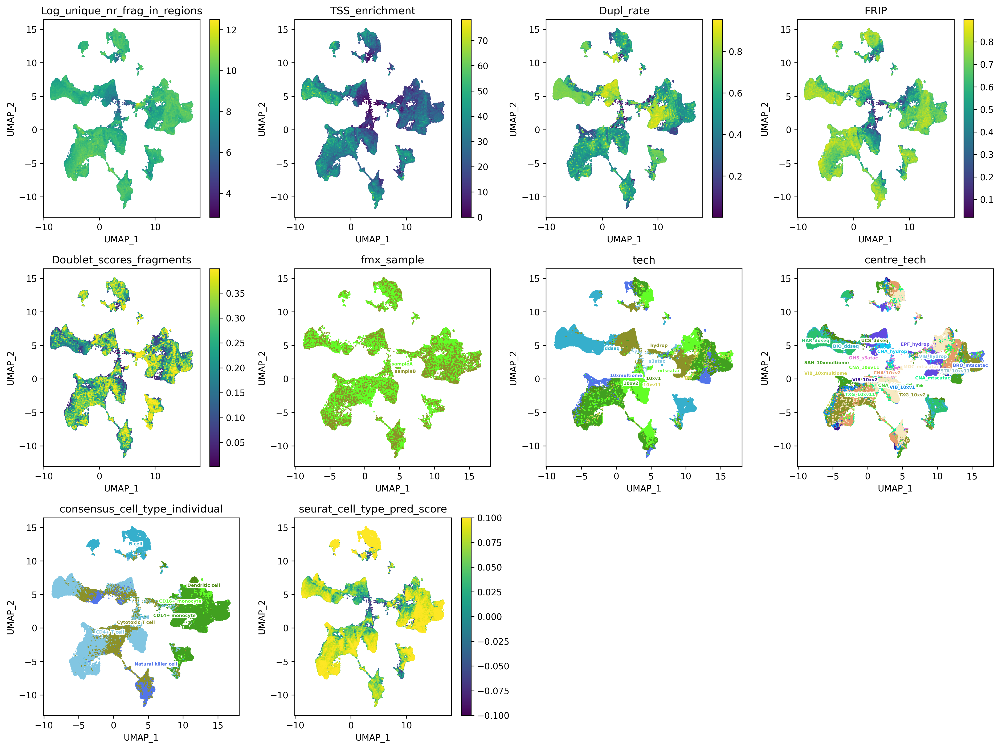

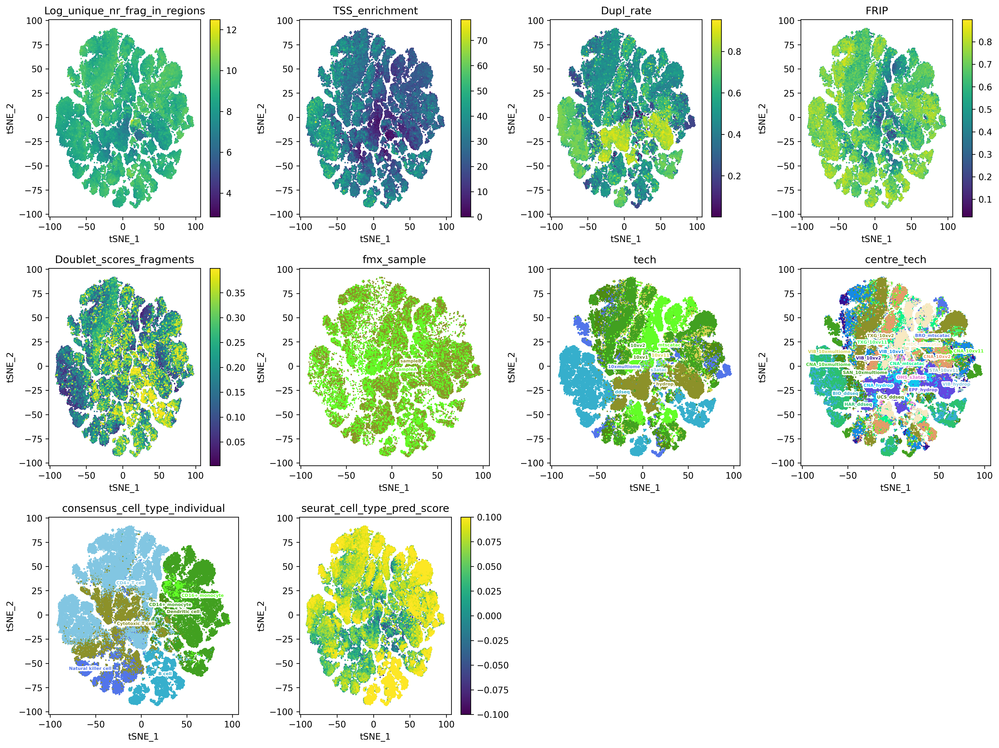

In [5]:
leiden_res = [3.0]
to_plot_leiden = ["pycisTopic_leiden_10_" + str(x) for x in leiden_res]

to_plot_vars = [
    "Unique_nr_frag",
    "TSS_enrichment",
    "Dupl_rate",
    "FRIP",
    "Doublet_scores_fragments",
    "fmx_sample",
]

for sample in cto_model_path_dict.keys():
    # for sample in ['VIB_hydrop_1.FIXEDCELLS']:
    to_plot = to_plot_vars + to_plot_leiden

    print(sample)
    cto_path = cto_model_path_dict[sample]
    cto_path_new = cto_path.replace(".pkl", ".dimreduc.pkl")

    if not os.path.exists(cto_path_new):
        with open(cto_path, "rb") as f:
            cto = pickle.load(f)

        # cto.add_cell_data(ct_annot)
        # cto.cell_data.index = index_old

        cto.cell_names = cto.cell_data.index

        cto.projections["cell"] = {}
        find_clusters(cto, target="cell", k=10, res=leiden_res, prefix="pycisTopic_")
        run_umap(cto, target="cell")
        run_tsne(cto, target="cell")

        if not "fmx_sample" in cto.cell_data.columns:
            to_plot.remove("fmx_sample")

        n_to_plot = len(to_plot)
        n_cols = 4
        n_rows = math.ceil(n_to_plot / n_cols)

        plot_metadata(
            cto,
            reduction_name="UMAP",
            variables=to_plot,
            target="cell",
            num_columns=4,
            text_size=16,
            dot_size=15,
            figsize=(n_cols * 4, n_rows * 4),
            save=f"plots_qc/{sample}__umap_summary.png",
        )

        plot_metadata(
            cto,
            reduction_name="tSNE",
            variables=to_plot,
            target="cell",
            num_columns=4,
            text_size=16,
            dot_size=15,
            figsize=(n_cols * 4, n_rows * 4),
            save=f"plots_qc/{sample}__tsne_summary.png",
        )

        with open(cto_path_new, "wb") as f:
            pickle.dump(cto, f, protocol=4)

    else:
        print(f"\t{cto_path_new} exists, skipping")

        umap_path = f"plots_qc/{sample}__umap_summary.png"
        tsne_path = f"plots_qc/{sample}__tsne_summary.png"

        if os.path.exists(umap_path):
            display(Image(umap_path))

        else:
            with open(cto_path_new, "rb") as f:
                cto = pickle.load(f)

            if not "fmx_sample" in cto.cell_data.columns:
                to_plot.remove("fmx_sample")

            n_to_plot = len(to_plot)
            n_cols = 4
            n_rows = math.ceil(n_to_plot / n_cols)

            plot_metadata(
                cto,
                reduction_name="UMAP",
                variables=to_plot,
                target="cell",
                num_columns=4,
                text_size=16,
                dot_size=15,
                figsize=(n_cols * 4, n_rows * 4),
                save=f"plots_qc/{sample}__umap_summary.png",
            )

        if os.path.exists(tsne_path):
            display(Image(tsne_path))

        else:
            with open(cto_path_new, "rb") as f:
                cto = pickle.load(f)

            n_to_plot = len(to_plot)
            n_cols = 4
            n_rows = math.ceil(n_to_plot / n_cols)

            plot_metadata(
                cto,
                reduction_name="tSNE",
                variables=to_plot,
                target="cell",
                num_columns=4,
                text_size=16,
                dot_size=15,
                figsize=(n_cols * 4, n_rows * 4),
                save=f"plots_qc/{sample}__tsne_summary.png",
            )

In [6]:
import numpy as np

import logging
import random
import sys
from typing import Dict, List, Optional, Tuple, Union

import harmonypy as hm
import igraph as ig
import leidenalg as la
import matplotlib.backends.backend_pdf
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.patheffects as PathEffects
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sklearn
import umap
from adjustText import adjust_text
from igraph import intersection
from sklearn.neighbors import kneighbors_graph

from pycisTopic.cistopic_class import *


def plot_metadata(
    cistopic_obj: "CistopicObject",
    reduction_name: str,
    variables: List[str],
    target: Optional[str] = "cell",
    remove_nan: Optional[bool] = True,
    show_label: Optional[bool] = True,
    show_legend: Optional[bool] = False,
    cmap: Optional[Union[str, "matplotlib.cm"]] = cm.viridis,
    dot_size: Optional[int] = 10,
    text_size: Optional[int] = 10,
    alpha: Optional[Union[float, int]] = 1,
    seed: Optional[int] = 555,
    color_dictionary: Optional[Dict[str, str]] = {},
    figsize: Optional[Tuple[float, float]] = (6.4, 4.8),
    num_columns: Optional[int] = 1,
    selected_features: Optional[List[str]] = None,
    save: Optional[str] = None,
):
    """
    Plot categorical and continuous metadata into dimensionality reduction.
    Parameters
    ---------
    cistopic_obj: `class::CistopicObject`
            A cisTopic object with dimensionality reductions in `class::CistopicObject.projections`.
    reduction_name: str
            Name of the dimensionality reduction to use
    variables: list
            List of variables to plot. They should be included in `class::CistopicObject.cell_data` and `class::CistopicObject.region_data`, depending on which
            target is specified.
    target: str, optional
            Whether cells ('cell') or regions ('region') should be used. Default: 'cell'
    remove_nan: bool, optional
            Whether to remove data points for which the variable value is 'nan'. Default: True
    show_label: bool, optional
            For categorical variables, whether to show the label in the plot. Default: True
    show_legend: bool, optional
            For categorical variables, whether to show the legend next to the plot. Default: False
    cmap: str or 'matplotlib.cm', optional
            For continuous variables, color map to use for the legend color bar. Default: cm.viridis
    dot_size: int, optional
            Dot size in the plot. Default: 10
    text_size: int, optional
            For categorical variables and if show_label is True, size of the labels in the plot. Default: 10
    alpha: float, optional
            Transparency value for the dots in the plot. Default: 1
    seed: int, optional
            Random seed used to select random colors. Default: 555
    color_dictionary: dict, optional
            A dictionary containing an entry per variable, whose values are dictionaries with variable levels as keys and corresponding colors as values.
            Default: None
    figsize: tuple, optional
            Size of the figure. If num_columns is 1, this is the size for each figure; if num_columns is above 1, this is the overall size of the figure (if keeping
            default, it will be the size of each subplot in the figure). Default: (6.4, 4.8)
    num_columns: int, optional
            For multiplot figures, indicates the number of columns (the number of rows will be automatically determined based on the number of plots). Default: 1
    selected_features: list, optional
            A list with selected features (cells or regions) to plot. This is recommended when working with regions (e.g. selecting
            regions in binarized topics), as working with all regions can be time consuming. Default: None (use all features)
    save: str, optional
            Path to save plot. Default: None.
    """
    if target == "cell":
        data_mat = cistopic_obj.cell_data
    if target == "region":
        data_mat = cistopic_obj.region_data

    embedding = cistopic_obj.projections[target][reduction_name]

    if selected_features is not None:
        data_mat = data_mat.loc[selected_features]
        embedding = embedding.loc[selected_features]

    data_mat = data_mat.loc[embedding.index.to_list()]
    pdf = None
    if (save is not None) & (num_columns == 1):
        pdf = matplotlib.backends.backend_pdf.PdfPages(save)

    if num_columns > 1:
        num_rows = int(np.ceil(len(variables) / num_columns))
        if figsize == (6.4, 4.8):
            figsize = (6.4 * num_columns, 4.8 * num_rows)
        i = 1

    fig = plt.figure(figsize=figsize)

    for var in variables:
        var_data = data_mat.copy().loc[:, var].dropna().to_list()
        if isinstance(var_data[0], str):
            if (remove_nan) & (data_mat[var].isnull().sum() > 0):
                var_data = data_mat.copy().loc[:, var].dropna().to_list()
                emb_nan = embedding.loc[
                    data_mat.copy().loc[:, var].dropna().index.tolist()
                ]
                label_pd = pd.concat(
                    [emb_nan, data_mat.loc[:, [var]].dropna()], axis=1, sort=False
                )
            else:
                var_data = (
                    data_mat.copy().astype(str).fillna("NA").loc[:, var].to_list()
                )
                label_pd = pd.concat(
                    [embedding, data_mat.astype(str).fillna("NA").loc[:, [var]]],
                    axis=1,
                    sort=False,
                )

            categories = set(var_data)
            try:
                color_dict = color_dictionary[var]
            except BaseException:
                random.seed(seed)
                color = list(
                    map(
                        lambda i: "#" + "%06x" % random.randint(0, 0xFFFFFF),
                        range(len(categories)),
                    )
                )
                color_dict = dict(zip(categories, color))

            if num_columns > 1:
                plt.subplot(num_rows, num_columns, i)
                i = i + 1

            if (remove_nan) & (data_mat[var].isnull().sum() > 0):
                plt.scatter(
                    emb_nan.iloc[:, 0],
                    emb_nan.iloc[:, 1],
                    c=data_mat.loc[:, var].dropna().apply(lambda x: color_dict[x]),
                    s=dot_size,
                    alpha=alpha,
                )
                plt.xlabel(emb_nan.columns[0])
                plt.ylabel(emb_nan.columns[1])
            else:
                plt.scatter(
                    embedding.iloc[:, 0],
                    embedding.iloc[:, 1],
                    c=data_mat.astype(str)
                    .fillna("NA")
                    .loc[:, var]
                    .apply(lambda x: color_dict[x]),
                    s=dot_size,
                    alpha=alpha,
                )
                plt.xlabel(embedding.columns[0])
                plt.ylabel(embedding.columns[1])

            if show_label:
                label_pos = label_pd.groupby(var).agg(
                    {label_pd.columns[0]: np.mean, label_pd.columns[1]: np.mean}
                )
                texts = []
                for label in label_pos.index.tolist():
                    texts.append(
                        plt.text(
                            label_pos.loc[label][0],
                            label_pos.loc[label][1],
                            label,
                            horizontalalignment="center",
                            verticalalignment="center",
                            size=text_size,
                            weight="bold",
                            color=color_dict[label],
                            path_effects=[
                                PathEffects.withStroke(linewidth=3, foreground="w")
                            ],
                        )
                    )
                adjust_text(texts)

            plt.title(var)
            patchList = []
            for key in color_dict:
                data_key = mpatches.Patch(color=color_dict[key], label=key)
                patchList.append(data_key)
            if show_legend:
                plt.legend(
                    handles=patchList, bbox_to_anchor=(1.04, 1), loc="upper left"
                )

            if num_columns == 1:
                if save is not None:
                    pdf.savefig(fig, bbox_inches="tight")
                plt.show()
        else:
            var_data = data_mat.copy().loc[:, var].to_list()
            o = np.argsort(var_data)
            if num_columns > 1:
                plt.subplot(num_rows, num_columns, i)
                i = i + 1
            plt.scatter(
                embedding.iloc[o, 0],
                embedding.iloc[o, 1],
                c=subset_list(var_data, o),
                cmap=cmap,
                s=dot_size,
                alpha=alpha,
            )
            plt.xlabel(embedding.columns[0])
            plt.ylabel(embedding.columns[1])
            plt.title(var)
            # setup the colorbar
            normalize = mcolors.Normalize(
                vmin=np.array(var_data).min(), vmax=np.array(var_data).max()
            )
            scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=cmap)
            scalarmappaple.set_array(var_data)
            plt.colorbar(scalarmappaple)
            if num_columns == 1:
                if save is not None:
                    pdf.savefig(fig, bbox_inches="tight", facecolor="white", dpi=300)
                plt.show()

    if num_columns > 1:
        plt.tight_layout()
        if save is not None:
            fig.savefig(save, bbox_inches="tight", facecolor="white", dpi=300)
        plt.show()
    if (save is not None) & (num_columns == 1):
        pdf = pdf.close()

# add mega annotation

In [7]:
cto_model_path_dict = {
    x.split("/")[-1].split(f"__")[0]: x
    for x in sorted(glob.glob("cistopic_objects_master/*singlets.model*dimreduc.pkl"))
}
cto_model_path_dict

{'master_all_1.FIXEDCELLS': 'cistopic_objects_master/master_all_1.FIXEDCELLS__cto.scrublet0-4.fmx.singlets.model_24topics.dimreduc.pkl'}

In [8]:
with open(cto_model_path_dict["master_all_1.FIXEDCELLS"], "rb") as f:
    cto = pickle.load(f)

In [9]:
df = pd.read_csv(
    "cell_type_classification/master_all_1.FIXEDCELLS__cell_type_seurat.txt",
    sep="\t",
    index_col=0,
)
df["index"] = df["barcode"] + ".FIXEDCELLS"
df["index"] = [x.replace("__", "___") for x in df["index"]]
df.set_index("index", inplace=True)

In [16]:
cto.cell_data["seurat_cell_type__mega"] = df["cell_type"]
cto.cell_data["seurat_cell_type_pred_score__mega"] = df["cell_type_pred_score"]

cto.cell_data["tech"] = [x.split("_")[1] for x in cto.cell_data["sample_id"]]

cto.cell_data["centre_tech"] = [
    x.split("_")[0] + "_" + x.split("_")[1] for x in cto.cell_data["sample_id"]
]

cto.cell_data["Log_unique_nr_frag_in_regions"] = np.log(
    cto.cell_data["Unique_nr_frag_in_regions"]
)

# consensus cluster

In [22]:
color_palette = {
    "B cell": (0.5105309046900421, 0.6614299289084904, 0.1930849118538962),
    "CD14+ monocyte": (0.7757319041862729, 0.5784925270759935, 0.19475566538551875),
    "CD16+ monocyte": (0.21662978923073606, 0.6676586160122123, 0.7318695594345369),
    "CD4+ T cell": (0.20433460114757862, 0.6863857739476534, 0.5407103379425205),
    "Cytotoxic T cell": (0.9587050080494409, 0.3662259565791742, 0.9231469575614251),
    "Dendritic cell": (0.5049017849530067, 0.5909119231215284, 0.9584657252128558),
    "Natural killer cell": (
        0.9677975592919913,
        0.44127456009157356,
        0.5358103155058701,
    ),
}

In [23]:
palette_dict = {x: color_palette for x in ["seurat_cell_type", "consensus_cell_type"]}

master_all_1.FIXEDCELLS


,cluster,major_cell_type,frac_of_cluster,next_celltype,next_frac_of_cluster,diff_to_next,cluster_counts
master_all_1.FIXEDCELLS__17,17,Cytotoxic T cell,0.516185,Natural killer cell,0.478306,0.037879,2904
master_all_1.FIXEDCELLS__30,30,CD14+ monocyte,0.370158,CD16+ monocyte,0.329986,0.040172,2091
master_all_1.FIXEDCELLS__77,77,CD14+ monocyte,0.44,Cytotoxic T cell,0.324,0.116,500
master_all_1.FIXEDCELLS__14,14,Natural killer cell,0.592201,Cytotoxic T cell,0.407138,0.185063,3026
master_all_1.FIXEDCELLS__28,28,CD4+ T cell,0.552113,Cytotoxic T cell,0.423944,0.128169,2130
master_all_1.FIXEDCELLS__59,59,CD4+ T cell,0.514233,Cytotoxic T cell,0.485767,0.028466,1089
master_all_1.FIXEDCELLS__36,36,CD16+ monocyte,0.553684,CD14+ monocyte,0.412105,0.141579,1900
master_all_1.FIXEDCELLS__72,72,Natural killer cell,0.518466,Cytotoxic T cell,0.34517,0.173295,704
master_all_1.FIXEDCELLS__73,73,Cytotoxic T cell,0.518355,CD14+ monocyte,0.417034,0.101322,681


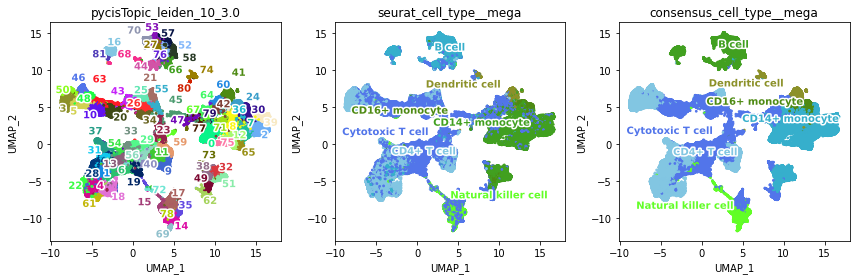

dumped_cto


In [18]:
clustering = "pycisTopic_leiden_10_3.0"
ct_pred_thr = 0.7

to_plot = [clustering, "seurat_cell_type__mega", "consensus_cell_type__mega"]
n_to_plot = len(to_plot)
n_cols = 3
n_rows = math.ceil(n_to_plot / n_cols)

clust_consensus = []
write = True


major_cell_type = []
frac_of_cluster = []
next_celltype = []
next_frac_of_cluster = []
diff_to_next = []

celldata = cto.cell_data

for c in celldata[clustering].unique():
    c1 = celldata[celldata[clustering] == c]
    # find proportions of each unique cell type detected in this cluster:
    ctp = pd.DataFrame(
        [
            c1["seurat_cell_type__mega"].unique(),
            [
                c1[c1["seurat_cell_type__mega"] == x].shape[0] / c1.shape[0]
                for x in c1["seurat_cell_type__mega"].unique()
            ],
        ]
    ).T
    # sort/rank by proportion:
    ctps = ctp.sort_values(1, ascending=False)
    if ctp.shape[0] > 1:
        n = ctps.iloc[1, 0]  # next cell type detected
        dtn = ctps.iloc[0, 1] - ctps.iloc[1, 1]  # distance to next
        dtnf = ctps.iloc[1, 1]
    else:
        dtn = None
        dtnf = None
        n = None
    major_cell_type.append(ctps.iloc[0, 0])
    frac_of_cluster.append(ctps.iloc[0, 1])
    next_celltype.append(n)
    next_frac_of_cluster.append(dtnf)
    diff_to_next.append(dtn)

# collect results for this sample
clust_consensus = (
    pd.DataFrame(
        [
            celldata[clustering].unique(),
            major_cell_type,
            frac_of_cluster,
            next_celltype,
            next_frac_of_cluster,
            diff_to_next,
        ]
    )
    .T.set_axis(
        [
            "cluster",
            "major_cell_type",
            "frac_of_cluster",
            "next_celltype",
            "next_frac_of_cluster",
            "diff_to_next",
        ],
        axis=1,
    )
    .set_index(sample + "__" + celldata[clustering].unique())
)
print(sample)
clust_consensus["cluster_counts"] = clust_consensus["cluster"].map(
    celldata[clustering].value_counts()
)
# print only rows where there is another cell type within 20%:
if sum(clust_consensus["diff_to_next"] < 0.20) > 0:
    display(clust_consensus[clust_consensus["diff_to_next"] < 0.20])

else:
    print("No discrepant clusters")

# add the mapping
cto.cell_data["consensus_cell_type__mega"] = ""
for i, r in clust_consensus.iterrows():
    ix = cto.cell_data[clustering] == r["cluster"]
    cto.cell_data.loc[ix, "consensus_cell_type__mega"] = r["major_cell_type"]

plot_metadata(
    cto,
    reduction_name="UMAP",
    variables=to_plot,
    target="cell",
    num_columns=n_cols,
    text_size=10,
    dot_size=3,
    figsize=(n_cols * 4, n_rows * 4),
    save=f"plots_qc/{sample}__consensus_clusters_qc.png",
    color_dictionary=palette_dict,
)

if write == True:
    with open(cto_path_new, "wb") as f:
        pickle.dump(cto, f)
    print("dumped_cto")

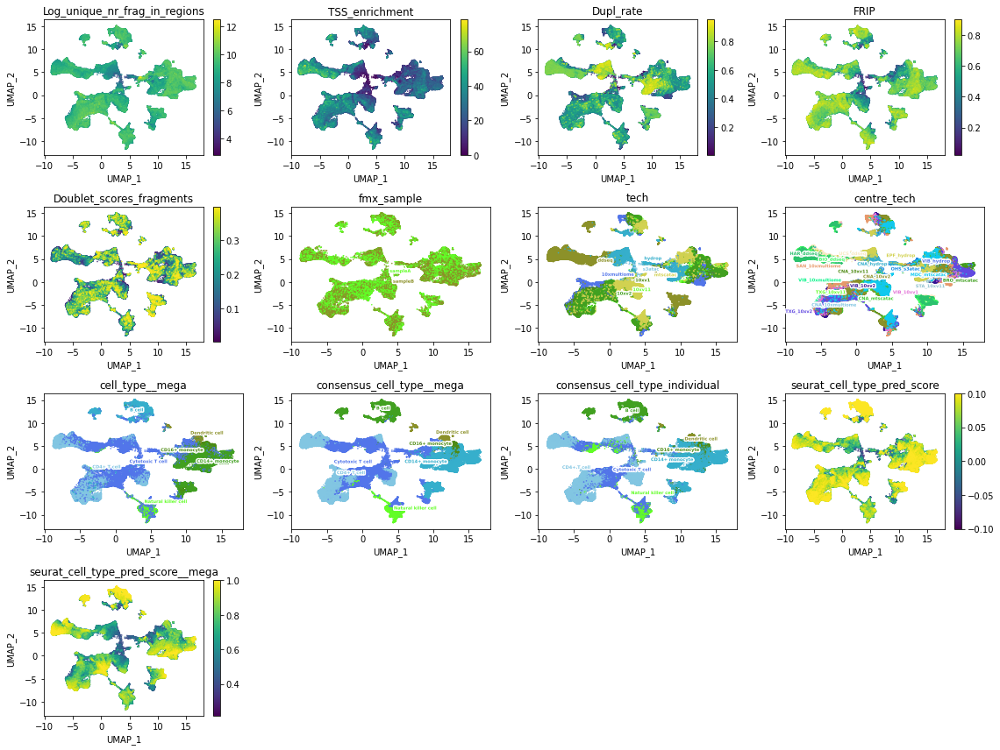

In [21]:
n_cols = 4
n_rows = 3
to_plot_vars = [
    "Log_unique_nr_frag_in_regions",
    "TSS_enrichment",
    "Dupl_rate",
    "FRIP",
    "Doublet_scores_fragments",
    "fmx_sample",
    "tech",
    "centre_tech",
    "cell_type__mega",
    "consensus_cell_type__mega",
    "consensus_cell_type_individual",
    "seurat_cell_type_pred_score",
    "seurat_cell_type_pred_score__mega",
]
plot_metadata(
    cto,
    reduction_name="UMAP",
    variables=to_plot_vars,
    target="cell",
    num_columns=4,
    text_size=5,
    dot_size=0.3,
    figsize=(n_cols * 4, n_rows * 4),
    save=f"plots_qc/{sample}__umap_summary.png",
)

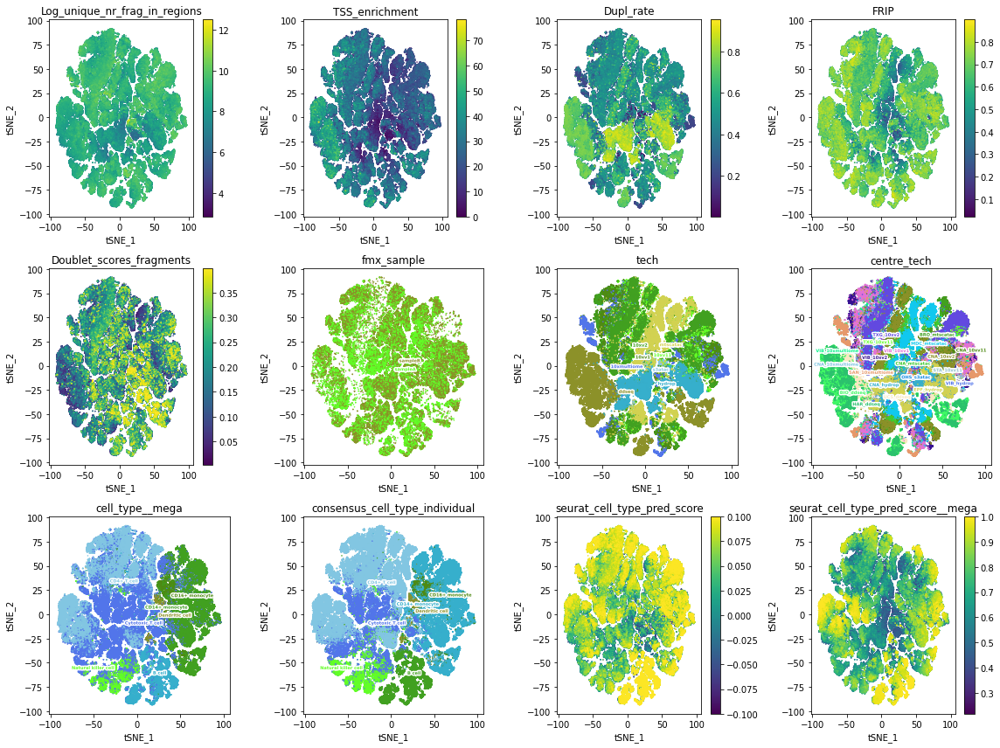

In [22]:
to_plot_vars = [
    "Log_unique_nr_frag_in_regions",
    "TSS_enrichment",
    "Dupl_rate",
    "FRIP",
    "Doublet_scores_fragments",
    "fmx_sample",
    "tech",
    "centre_tech",
    "cell_type__mega",
    "consensus_cell_type_individual",
    "seurat_cell_type_pred_score",
    "seurat_cell_type_pred_score__mega",
]
plot_metadata(
    cto,
    reduction_name="tSNE",
    variables=to_plot_vars,
    target="cell",
    num_columns=4,
    text_size=5,
    dot_size=0.3,
    figsize=(n_cols * 4, n_rows * 4),
    save=f"plots_qc/{sample}__tsne_summary.png",
)

# add old cell datas

In [33]:
cell_data_paths = {
    x.split("/")[-1].split("__")[0]: x
    for x in glob.glob(
        "../fixedcells_3_cistopic_consensus/cistopic_objects/*.dimreduc.consensus.cell_data.tsv"
    )
}

In [42]:
df_merged = pd.DataFrame()
for sample, path in cell_data_paths.items():
    print(sample)
    df = pd.read_csv(path, index_col=0)
    df_merged = pd.concat([df_merged, df])

BRO_mtscatac_1.FIXEDCELLS
CNA_mtscatac_2.FIXEDCELLS
STA_10xv11_1.FIXEDCELLS
MDC_mtscatac_1.FIXEDCELLS
CNA_10xv2_2.FIXEDCELLS
HAR_ddseq_1.FIXEDCELLS
VIB_10xmultiome_1.FIXEDCELLS
CNA_10xmultiome_2.FIXEDCELLS
EPF_hydrop_1.FIXEDCELLS
BIO_ddseq_2.FIXEDCELLS
VIB_hydrop_1.FIXEDCELLS
VIB_hydrop_2.FIXEDCELLS
CNA_10xv11_4.FIXEDCELLS
BIO_ddseq_4.FIXEDCELLS
CNA_hydrop_1.FIXEDCELLS
VIB_10xv2_1.FIXEDCELLS
BIO_ddseq_3.FIXEDCELLS
EPF_hydrop_3.FIXEDCELLS
CNA_10xv2_1.FIXEDCELLS
CNA_10xv11_1.FIXEDCELLS
CNA_10xv11_2.FIXEDCELLS
VIB_10xv2_2.FIXEDCELLS
MDC_mtscatac_2.FIXEDCELLS
CNA_10xv11_5.FIXEDCELLS
CNA_hydrop_3.FIXEDCELLS
SAN_10xmultiome_2.FIXEDCELLS
OHS_s3atac_2.FIXEDCELLS
UCS_ddseq_1.FIXEDCELLS
SAN_10xmultiome_1.FIXEDCELLS
VIB_10xmultiome_2.FIXEDCELLS
VIB_10xv1_1.FIXEDCELLS
TXG_10xv2_2.FIXEDCELLS
UCS_ddseq_2.FIXEDCELLS
VIB_10xv1_2.FIXEDCELLS
CNA_10xv11_3.FIXEDCELLS
STA_10xv11_2.FIXEDCELLS
CNA_hydrop_2.FIXEDCELLS
HAR_ddseq_2.FIXEDCELLS
TXG_10xv11_1.FIXEDCELLS
BRO_mtscatac_2.FIXEDCELLS
EPF_hydrop_4.FIXEDC

In [48]:
cto.cell_data["seurat_cell_type__individual"] = df_merged["seurat_cell_type"]

In [50]:
cto_path_new = "cistopic_objects/master_all_1.FIXEDCELLS__cto.scrublet0-4.fmx.singlets.model_24topics.dimreduc.pkl"
with open(cto_path_new, "wb") as f:
    pickle.dump(cto, f)
print("dumped_cto")

dumped_cto


In [51]:
cto.cell_data.to_csv(
    "cistopic_objects/master_all_1.FIXEDCELLS__cto.scrublet0-4.fmx.singlets.model_24topics.dimreduc.consensus__cell_data.pkl"
)

# harmony

In [11]:
from pycisTopic.clust_vis import harmony

In [12]:
with open(
    "cistopic_objects_master/master_all_1.FIXEDCELLS__cto.scrublet0-4.fmx.singlets.model_24topics.dimreduc.consensus.pkl",
    "rb",
) as f:
    cto = pickle.load(f)

In [13]:
harmony(cto, "tech", random_state=555, max_iter_harmony=20)

2023-01-04 11:38:58,631 - harmonypy - INFO - Iteration 1 of 20
2023-01-04 11:39:37,455 - harmonypy - INFO - Iteration 2 of 20
2023-01-04 11:40:16,516 - harmonypy - INFO - Iteration 3 of 20
2023-01-04 11:40:55,429 - harmonypy - INFO - Iteration 4 of 20
2023-01-04 11:41:34,368 - harmonypy - INFO - Iteration 5 of 20
2023-01-04 11:42:18,325 - harmonypy - INFO - Iteration 6 of 20
2023-01-04 11:42:58,596 - harmonypy - INFO - Iteration 7 of 20
2023-01-04 11:43:41,274 - harmonypy - INFO - Converged after 7 iterations


In [16]:
cto.cell_names = cto.cell_data.index
leiden_res = [3.0]
# cto.projections["cell"] = {}
find_clusters(
    cto, target="cell", k=10, res=leiden_res, prefix="harmony_pycisTopic_", harmony=True
)
run_umap(cto, target="cell", reduction_name="UMAP_harmony", harmony=True)
run_tsne(cto, target="cell", reduction_name="tSNE_harmony", harmony=True)

2023-01-04 11:54:55,280 cisTopic     INFO     Finding neighbours
2023-01-04 12:03:05,723 cisTopic     INFO     Running UMAP
2023-01-04 12:05:43,846 cisTopic     INFO     Running FItSNE
Will use momentum during exaggeration phase
Computing input similarities...
Using perplexity, so normalizing input data (to prevent numerical problems)
Using perplexity, not the manually set kernel width.  K (number of nearest neighbors) and sigma (bandwidth) parameters are going to be ignored.
Using ANNOY for knn search, with parameters: n_trees 50 and search_k 4500
Going to allocate memory. N: 169227, K: 90, N*K = 15230430
Building Annoy tree...
Done building tree. Beginning nearest neighbor search... 
parallel (72 threads):


In [20]:
sample = "master_all_1.FIXEDCELLS"

master_all_1.FIXEDCELLS


,cluster,major_cell_type,frac_of_cluster,next_celltype,next_frac_of_cluster,diff_to_next,cluster_counts
master_all_1.FIXEDCELLS__31,31,CD14+ monocyte,0.498236,Cytotoxic T cell,0.488536,0.0097,2268
master_all_1.FIXEDCELLS__24,24,CD4+ T cell,0.526395,Cytotoxic T cell,0.463497,0.062898,2671
master_all_1.FIXEDCELLS__55,55,Cytotoxic T cell,0.548503,CD4+ T cell,0.421557,0.126946,835
master_all_1.FIXEDCELLS__69,69,CD14+ monocyte,0.404145,Cytotoxic T cell,0.295337,0.108808,579
master_all_1.FIXEDCELLS__25,25,CD4+ T cell,0.542306,Cytotoxic T cell,0.441165,0.101141,2541
master_all_1.FIXEDCELLS__57,57,B cell,0.460494,CD4+ T cell,0.274074,0.18642,810
master_all_1.FIXEDCELLS__58,58,CD16+ monocyte,0.4625,CD14+ monocyte,0.46125,0.00125,800
master_all_1.FIXEDCELLS__52,52,CD14+ monocyte,0.509091,Cytotoxic T cell,0.3875,0.121591,880
master_all_1.FIXEDCELLS__71,71,CD4+ T cell,0.563923,Cytotoxic T cell,0.432574,0.131349,571
master_all_1.FIXEDCELLS__74,74,CD4+ T cell,0.586745,Cytotoxic T cell,0.395712,0.191033,513


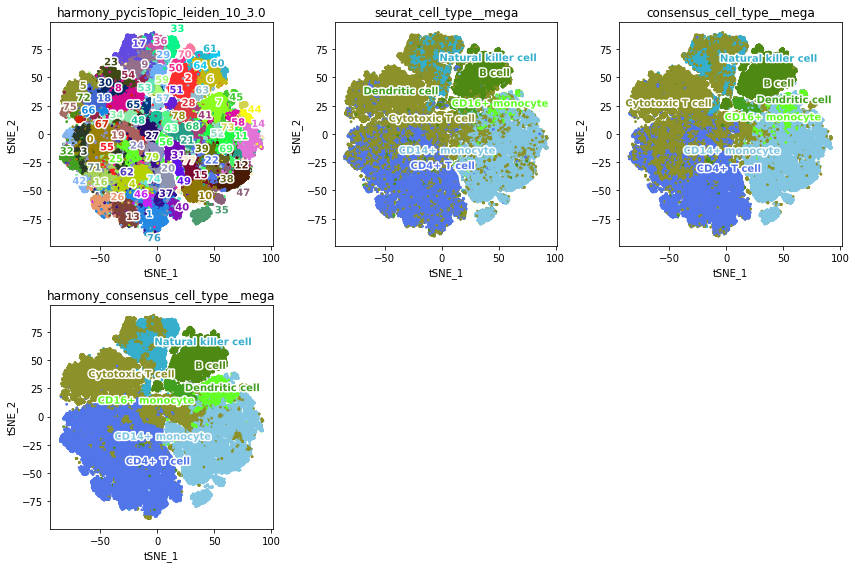

dumped_cto


In [25]:
clustering = "harmony_pycisTopic_leiden_10_3.0"
ct_pred_thr = 0.7

to_plot = [
    clustering,
    "seurat_cell_type__mega",
    "consensus_cell_type__mega",
    "harmony_consensus_cell_type__mega",
]
n_to_plot = len(to_plot)
n_cols = 3
n_rows = math.ceil(n_to_plot / n_cols)

clust_consensus = []
write = True


major_cell_type = []
frac_of_cluster = []
next_celltype = []
next_frac_of_cluster = []
diff_to_next = []

celldata = cto.cell_data

for c in celldata[clustering].unique():
    c1 = celldata[celldata[clustering] == c]
    # find proportions of each unique cell type detected in this cluster:
    ctp = pd.DataFrame(
        [
            c1["seurat_cell_type__mega"].unique(),
            [
                c1[c1["seurat_cell_type__mega"] == x].shape[0] / c1.shape[0]
                for x in c1["seurat_cell_type__mega"].unique()
            ],
        ]
    ).T
    # sort/rank by proportion:
    ctps = ctp.sort_values(1, ascending=False)
    if ctp.shape[0] > 1:
        n = ctps.iloc[1, 0]  # next cell type detected
        dtn = ctps.iloc[0, 1] - ctps.iloc[1, 1]  # distance to next
        dtnf = ctps.iloc[1, 1]
    else:
        dtn = None
        dtnf = None
        n = None
    major_cell_type.append(ctps.iloc[0, 0])
    frac_of_cluster.append(ctps.iloc[0, 1])
    next_celltype.append(n)
    next_frac_of_cluster.append(dtnf)
    diff_to_next.append(dtn)

# collect results for this sample
clust_consensus = (
    pd.DataFrame(
        [
            celldata[clustering].unique(),
            major_cell_type,
            frac_of_cluster,
            next_celltype,
            next_frac_of_cluster,
            diff_to_next,
        ]
    )
    .T.set_axis(
        [
            "cluster",
            "major_cell_type",
            "frac_of_cluster",
            "next_celltype",
            "next_frac_of_cluster",
            "diff_to_next",
        ],
        axis=1,
    )
    .set_index(sample + "__" + celldata[clustering].unique())
)
print(sample)
clust_consensus["cluster_counts"] = clust_consensus["cluster"].map(
    celldata[clustering].value_counts()
)
# print only rows where there is another cell type within 20%:
if sum(clust_consensus["diff_to_next"] < 0.20) > 0:
    display(clust_consensus[clust_consensus["diff_to_next"] < 0.20])

else:
    print("No discrepant clusters")

# add the mapping
cto.cell_data["harmony_consensus_cell_type__mega"] = ""
for i, r in clust_consensus.iterrows():
    ix = cto.cell_data[clustering] == r["cluster"]
    cto.cell_data.loc[ix, "harmony_consensus_cell_type__mega"] = r["major_cell_type"]

plot_metadata(
    cto,
    reduction_name="tSNE_harmony",
    variables=to_plot,
    target="cell",
    num_columns=n_cols,
    text_size=10,
    dot_size=3,
    figsize=(n_cols * 4, n_rows * 4),
    save=f"plots_qc/{sample}__harmony_consensus_clusters_qc.png",
    color_dictionary=palette_dict,
)

if write == True:
    with open(
        "cistopic_objects_master/master_all_1.FIXEDCELLS__cto.scrublet0-4.fmx.singlets.model_24topics.dimreduc.consensus_harmony.pkl",
        "wb",
    ) as f:
        pickle.dump(cto, f)
    print("dumped_cto")

# nice plot

In [2]:
import pickle
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
with open(
    "cistopic_objects_master/master_all_1.FIXEDCELLS__cto.scrublet0-4.fmx.singlets.model_24topics.dimreduc.consensus_harmony.pkl",
    "rb",
) as f:
    cto = pickle.load(f)

In [4]:
cto.cell_data

,cisTopic_log_nr_frag,cisTopic_nr_frag,cisTopic_log_nr_acc,cisTopic_nr_acc,Log_total_nr_frag,Log_unique_nr_frag,Total_nr_frag,Unique_nr_frag,Dupl_nr_frag,Dupl_rate,...,centre_tech,Log_unique_nr_frag_in_regions,consensus_cell_type_individual,seurat_cell_type_pred_score,cell_type__mega,seurat_cell_type_pred_score__mega,consensus_cell_type__mega,seurat_cell_type__mega,harmony_pycisTopic_leiden_10_3.0,harmony_consensus_cell_type__mega
TCCTGAGCGAACGTCAGGGAACCGCG___OHS_s3atac_2.FIXEDCELLS,3.436481,2732,3.321598,2097,4.540492,4.520903,34713,33182,1531,0.044105,...,OHS_s3atac,7.627057,B cell,0.724987,Cytotoxic T cell,0.417394,Cytotoxic T cell,Cytotoxic T cell,43,Cytotoxic T cell
ACGCGACGACCGGAAGAAGCACGGAC___OHS_s3atac_2.FIXEDCELLS,3.295567,1975,2.93852,868,4.001474,3.981003,10034,9572,462,0.046043,...,OHS_s3atac,7.431892,CD4+ T cell,0.376578,B cell,0.342953,Cytotoxic T cell,B cell,20,CD4+ T cell
GGTTAGTTCAAGTAGGACTATCGCAC___OHS_s3atac_2.FIXEDCELLS,3.398287,2502,3.242541,1748,4.226136,4.202870,16832,15954,878,0.052163,...,OHS_s3atac,7.489971,CD4+ T cell,0.531326,Cytotoxic T cell,0.391198,Cytotoxic T cell,Cytotoxic T cell,59,Natural killer cell
CTCTCTACTGAACGGCGTCTGCTTCC___OHS_s3atac_2.FIXEDCELLS,3.845284,7003,3.750431,5629,4.480108,4.457746,30207,28691,1516,0.050187,...,OHS_s3atac,8.672828,NaN,NaN,B cell,0.327305,Cytotoxic T cell,B cell,76,Cytotoxic T cell
ATTGAGGAAATGATGCTCCTGCTTCC___OHS_s3atac_2.FIXEDCELLS,3.206286,1608,3.068928,1172,3.818688,3.796227,6587,6255,332,0.050402,...,OHS_s3atac,7.195937,Cytotoxic T cell,0.441366,Cytotoxic T cell,0.375826,Cytotoxic T cell,Cytotoxic T cell,65,Natural killer cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGACTTCTGAG___MDC_mtscatac_1.FIXEDCELLS,3.738543,5477,3.263873,1836,4.283573,4.080951,19212,12049,7163,0.372840,...,MDC_mtscatac,7.414573,CD4+ T cell,0.309143,Cytotoxic T cell,0.388897,Cytotoxic T cell,Cytotoxic T cell,0,CD4+ T cell
CATCAGAACCCGGACT___MDC_mtscatac_1.FIXEDCELLS,3.416308,2608,2.569374,371,3.753353,3.514415,5667,3269,2398,0.423152,...,MDC_mtscatac,6.028279,CD4+ T cell,0.402943,Cytotoxic T cell,0.432030,CD4+ T cell,Cytotoxic T cell,43,Cytotoxic T cell
GAACCATACTACACTG___MDC_mtscatac_1.FIXEDCELLS,3.26031,1821,3.084934,1216,3.563006,3.408410,3656,2561,1095,0.299508,...,MDC_mtscatac,7.017506,Cytotoxic T cell,0.450904,Cytotoxic T cell,0.412242,Cytotoxic T cell,Cytotoxic T cell,8,Cytotoxic T cell
CAGTTGATGGCACGCT___MDC_mtscatac_1.FIXEDCELLS,3.425371,2663,2.921686,835,4.046729,3.840984,11136,6934,4202,0.377335,...,MDC_mtscatac,6.751101,Cytotoxic T cell,0.334340,Cytotoxic T cell,0.395910,Cytotoxic T cell,Cytotoxic T cell,54,Cytotoxic T cell


In [5]:
cto.projections.keys()

dict_keys(['cell'])

In [6]:
for key in cto.projections["cell"].keys():
    print(key)
    for column in cto.projections["cell"][key].columns:
        print(column)
        dim = list(cto.projections["cell"][key].columns).index(column) + 1
        print(f"\t{key}_{dim}")
        cto.cell_data[f"{key}_{dim}"] = cto.projections["cell"][key][column]

UMAP
UMAP_1
	UMAP_1
UMAP_2
	UMAP_2
tSNE
tSNE_1
	tSNE_1
tSNE_2
	tSNE_2
UMAP_harmony
UMAP_1
	UMAP_harmony_1
UMAP_2
	UMAP_harmony_2
tSNE_harmony
tSNE_1
	tSNE_harmony_1
tSNE_2
	tSNE_harmony_2


In [13]:
cell_data_path = "cistopic_objects_master/master_all_1.FIXEDCELLS__cto.scrublet0-4.fmx.singlets.model_24topics.dimreduc.consensus_harmony.pkl".replace(
    ".pkl", ".cell_data.pkl"
)
cto.cell_data.to_csv(cell_data_path)

In [29]:
tech_order = [
    "10xv1",
    "10xv11",
    "10xv2",
    "10xmultiome",
    "mtscatac",
    "ddseq",
    "s3atac",
    "hydrop",
]

tech_color_palette = {
    "10xv2": "#1b9e77",
    "10xv1": "#d95f02",
    "10xv11": "#7570b3",
    "10xmultiome": "#e7298a",
    "mtscatac": "#66a61e",
    "ddseq": "#e6ab02",
    "s3atac": "#a6761d",
    "hydrop": "#666666",
}


cell_type_color_dict = {
    "B_cell": "#117733",
    "CD14+_monocyte": "#DDCC77",
    "CD4+_T_cell": "#CC6677",
    "Cytotoxic_T_cell": "#88CCEE",
    "Dendritic_cell": "#44AA99",
    "Natural_killer_cell": "#332288",
    "CD16+_monocyte": "#AA4499",
}
tech_alias_dict = {
    "10xmultiome": "10x Multiome",
    "10xv1": "10x v1",
    "10xv11": "10x v1.1",
    "10xv11c": "10x v1.1 (control)",
    "10xv2": "10x v2",
    "ddseq": "Bio-Rad ddSEQ SureCell",
    "hydrop": "HyDrop",
    "mtscatac": "mtscATAC-seq",
    "mtscatacfacs": "mtscATAC-seq (FACS)",
    "s3atac": "s3-ATAC",
}
cell_type_alias_dict = {
    "B_cell": "B cells",
    "CD14+_monocyte": "CD14+ monocytes",
    "CD4+_T_cell": "CD4+ T cells",
    "Cytotoxic_T_cell": "CD8+ T cells",
    "Dendritic_cell": "Dendritic cells",
    "Natural_killer_cell": "NK cells",
    "CD16+_monocyte": "CD16+ monocytes",
}

cell_type_order = [
    "B_cell",
    "CD14+_monocyte",
    "CD4+_T_cell",
    "Cytotoxic_T_cell",
    "Dendritic_cell",
    "Natural_killer_cell",
    "CD16+_monocyte",
]

In [30]:
variables = ["tech", "harmony_consensus_cell_type__mega"]
color_dict_dict = {}
color_dict_dict["tech"] = tech_color_palette
color_dict_dict["harmony_consensus_cell_type__mega"] = cell_type_color_dict

alias_dict_dict = {}
alias_dict_dict["tech"] = tech_alias_dict
alias_dict_dict["harmony_consensus_cell_type__mega"] = cell_type_alias_dict

order_dict_dict = {}
order_dict_dict["tech"] = tech_order
order_dict_dict["harmony_consensus_cell_type__mega"] = cell_type_order

In [47]:
variable_alias_dict = {
    "tech": "Technology",
    "harmony_consensus_cell_type__mega": "Cell type",
}

In [ ]:
fig, axes = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(6, 8))
fig.tight_layout()
axes = axes.flatten()

df = pd.read_csv(cell_data_path, index_col=0)

for variable in variables:
    print(variable)

    df["harmony_consensus_cell_type__mega"] = [
        x.replace(" ", "_") for x in df["harmony_consensus_cell_type__mega"]
    ]
    df = df.sample(
        frac=1
    )  # shuffle rows so that no cell type is biased to be displayed above another one

    ax = axes[variables.index(variable)]

    sns.scatterplot(
        data=df,
        x="tSNE_harmony_1",
        y="tSNE_harmony_2",
        hue=variable,
        s=3,
        linewidth=0,
        ax=ax,
        legend=False,
        palette=color_dict_dict[variable],
    )

    # ax.get_legend().remove()
    # ax.set(adjustable="box", aspect="equal")
    ax.set_aspect("equal")
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.title.set_text(variable_alias_dict[variable])
    sns.despine(left=True, bottom=True)

plt.savefig(
    "plts_final/tSNE_all.png",
    dpi=900,
    facecolor="white",
    bbox_inches="tight",
)
plt.savefig(
    "plts_final/tSNE_all.svg",
    dpi=900,
    facecolor="white",
    bbox_inches="tight",
)

tech
harmony_consensus_cell_type__mega


tech
harmony_consensus_cell_type__mega


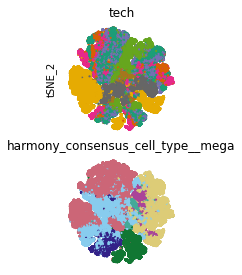

In [44]:



# for variable in variables:
#     ax = axes[variables.index(variable)]

#     handles, labels = ax.get_legend_handles_labels()
#     l = plt.legend(
#         handles[0 : len(order_dict_dict[variable])],
#         [
#             alias_dict_dict[variable][x]
#             for x in labels[0 : len(order_dict_dict[variable])]
#         ],
#         bbox_to_anchor=(1.05, 1),
#         loc=2,
#         borderaxespad=0.0,
#     )
#     print(labels)

# plt.show()

['10xv2', 'ddseq', '10xmultiome', 'hydrop', '10xv1', '10xv11', 'mtscatac', 's3atac']


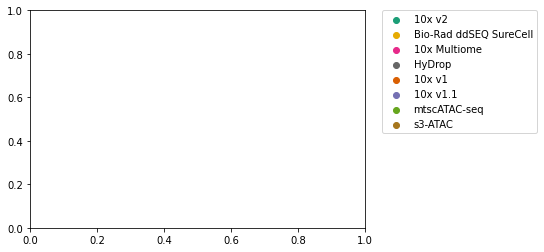

In [41]:
variable = "tech"
ax = axes[0]

handles, labels = ax.get_legend_handles_labels()
l = plt.legend(
    handles[0 : len(order_dict_dict[variable])],
    [alias_dict_dict[variable][x] for x in labels[0 : len(order_dict_dict[variable])]],
    bbox_to_anchor=(1.05, 1),
    loc=2,
    borderaxespad=0.0,
)
print(labels)